# Fix probe offsets
1) sample from the target data (simulatea observations)
2) Retrain probe with static information (catchment-specific covariates)
3) retrain probe with one hot encodings

In [2]:
from pathlib import Path
import numpy as np 
import xarray as xr 
import matplotlib.pyplot as plt
import seaborn as sns
import warnings 
import pandas as pd

import sys
sys.path.append("/home/tommy/neuralhydrology")
from scripts.read_nh_results import (
    get_test_filepath,
    get_all_station_ds,
    calculate_all_error_metrics,
    get_ensemble_path,
)

from scripts.read_model import (get_model, _load_weights)
from scripts.read_nh_results import (read_multi_experiment_results, calculate_member_errors)
from neuralhydrology.utils.config import Config

%load_ext autoreload
%autoreload 2

In [3]:
data_dir = Path("/datadrive/data")
run_dir = data_dir / "runs/complexity_AZURE/hs_064_0306_205514"
out_dir = run_dir / "cell_states"

In [4]:
import geopandas as gpd
from scripts.geospatial import initialise_gb_spatial_plot, load_latlon_points
from mpl_toolkits.axes_grid1 import make_axes_locatable

st_data_dir = Path("/home/tommy/spatio_temporal/data")
points = load_latlon_points(data_dir)
static = xr.open_dataset(data_dir / "camels_static.nc")

ds = xr.open_dataset(data_dir / "RUNOFF/ALL_dynamic_ds.nc")

In [5]:
cfg = Config(run_dir / "config.yml")

In [6]:
from scripts.cell_state.utils import (
    read_basin_list, 
    get_train_test_cell_states, 
    normalize_and_convert_dimension_to_variable_for_cell_state_data, 
    create_train_test_default_dict_for_all_target_vars, 
    train_and_evaluate_models
)

In [7]:
TARGET = "ERA5"
PER_BASIN = False
SHORT_TRAIN = True
ELASTICNET = True

## Get training/test dataset

In [7]:
train_sids = read_basin_list(cfg.train_basin_file)
test_sids = read_basin_list(cfg.test_basin_file)
train_ds = ds.sel(time=slice(cfg.train_start_date, cfg.train_end_date), station_id=np.isin(ds.station_id, train_sids.station_id))
test_ds = ds.sel(time=slice(cfg.test_start_date, cfg.test_end_date), station_id=np.isin(ds.station_id, test_sids.station_id))

out_of_sample = not all(np.isin(test_sids, train_sids))
print(f"Out of Sample: {not all(np.isin(test_sids, train_sids))}")

Out of Sample: False


## Probe the basins

In [8]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

train_cn, test_cn = get_train_test_cell_states(run_dir, cfg)

# Normalisation strategy - global or local?

In [9]:
cn = xr.concat([train_cn, test_cn], dim="date")
cn_station_mean_ = train_cn.mean(dim="date")
cn_station_std_ = train_cn.std(dim="date")
station_norm_cn = (cn - cn_station_mean_) / cn_station_std_

In [10]:
from scripts.cell_state.utils import normalize_and_convert_dimension_to_variable_for_cell_state_data


train_cs, (mean_, std_) = normalize_and_convert_dimension_to_variable_for_cell_state_data(
    cn=train_cn,
    out_dir=out_dir, 
    per_basin=PER_BASIN,
    train_test="train",
    time_dim="date",
    reload=True
)

test_cs, (mean_, std_) = normalize_and_convert_dimension_to_variable_for_cell_state_data(
    cn=test_cn,
    out_dir=out_dir, 
    per_basin=PER_BASIN,
    train_test="test",
    time_dim="date",
    reload=True,
    mean_=mean_,
    std_=std_
)

print("DONE")

Calculating Normalisation for `train` data: global
Calculating Normalisation for `test` data: global
DONE


In [11]:
train_cs["station_id"] = train_cs["station_id"].astype(int)
test_cs["station_id"] = test_cs["station_id"].astype(int)

train_cs = train_cs if (not "date" in train_cs.coords) else train_cs.rename({"date": "time"})
test_cs = test_cs if (not "date" in test_cs.coords) else test_cs.rename({"date": "time"})

In [12]:
if SHORT_TRAIN:
    train_cs = train_cs.sel(time=slice("01-01-1988", "12-31-1997"))

# Target Data

In [13]:
from scripts.cell_state.normalize import normalize_2d_dataset


if TARGET == "ERA5":
    filepath = data_dir / "camels_basin_ERA5Land_sm.nc"
    era5_ds = xr.open_dataset(filepath)

    if not isinstance(era5_ds, xr.Dataset):
        era5_ds = era5_ds.to_dataset()
    
    era5_ds_norm = era5_ds.copy()
    for var in era5_ds.data_vars:
        era5_ds_norm[var] = normalize_2d_dataset(era5_ds, variable_str=var, per_basin=PER_BASIN)

    era5_ds_norm["station_id"] = era5_ds_norm["station_id"].astype(int)
    era5_ds["station_id"] = era5_ds["station_id"].astype(int)

    # NOT for snow depth ..?
    target_ds = era5_ds_norm.drop("sd").copy()

elif TARGET == "ESA":
    filepath = data_dir / "SOIL_MOISTURE/interp_full_timeseries_esa_cci_sm.nc"
    esa_ds = xr.open_dataset(filepath).drop("spatial_ref")
    if not isinstance(esa_ds, xr.Dataset):
        esa_ds = esa_ds.to_dataset()
    
    esa_ds_norm = esa_ds.copy()
    for var in esa_ds.data_vars:
        esa_ds_norm[var] = normalize_2d_dataset(esa_ds, variable_str=var, per_basin=PER_BASIN)

    esa_ds_norm["station_id"] = esa_ds_norm["station_id"].astype(int)
    esa_ds["station_id"] = esa_ds["station_id"].astype(int)
    
    target_ds = esa_ds_norm
else:
    assert False
    
print(f"Loaded {TARGET} data with {'local' if PER_BASIN else 'global'} Normalisation")

Loaded ERA5 data with global Normalisation


In [14]:
train_target_ds = target_ds.sel(time=np.isin(target_ds.time, train_cs.time))
test_target_ds = target_ds.sel(time=np.isin(target_ds.time, test_cs.time))
input_variables = [f"dim{i}" for i in np.arange(64)]

In [15]:
train_target_ds

<xarray.Dataset>
Dimensions:      (station_id: 670, time: 3653)
Coordinates:
  * time         (time) datetime64[ns] 1988-01-01 1988-01-02 ... 1997-12-31
    spatial_ref  int64 ...
  * station_id   (station_id) int64 10002 10003 1001 ... 96002 96004 97002
Data variables:
    swvl1        (station_id, time) float64 -0.2353 -0.227 ... 2.759 2.859
    swvl2        (station_id, time) float64 0.4955 0.4955 0.4955 ... 2.767 2.921
    swvl3        (station_id, time) float64 -0.234 -0.2215 -0.212 ... 2.708 2.72
    swvl4        (station_id, time) float64 -0.8032 -0.799 ... 2.455 2.461

# One probe per basin

In [16]:
assert False

AssertionError: 

In [ ]:
all_probe_train_test = {}
for sid in train_cs.station_id.values:
    probe_train_test = create_train_test_default_dict_for_all_target_vars(
        train_cs=train_cs.sel(station_id=sid),
        test_cs=test_cs.sel(station_id=sid),
        train_target_ds=train_target_ds.sel(station_id=sid),
        test_target_ds=test_target_ds.sel(station_id=sid),
        input_variables=input_variables,
    )
    all_probe_train_test[sid] = probe_train_test

# Sample from the target [simulate observations] 

## Load trained models and predictions

In [ ]:
assert False, "Definitely Running Experiment 1 (Measuring/sampling from the true data)"

In [ ]:
from scripts.cell_state.analysis import save_probe_components, load_probe_components

In [ ]:
all_models_preds = load_probe_components(run_dir)
# all_models_preds

### sample n observations from the test period to estimate the offset?

In [ ]:
from sklearn.metrics import mean_squared_error
from collections import defaultdict
from tqdm import tqdm

N_SAMPLES = 1
to_xarray = False
N_SIMS = 10
sampled_time = np.random.choice(diff.time, N_SAMPLES)

ALL_VARS = dict()
for var in all_models_preds.keys():
    p = all_models_preds[var]["preds"]
    diff = p["obs"] - p["sim"]
    estimate = diff.sel(time=sampled_time)

    ALL = {1: {}, 2: {}, 3: {}, 4: {}, 5: {}}
    for N_SAMPLES in tqdm(np.arange(1, 6), desc=f"Simulating Measurements of {var}"):
        medians = defaultdict(list)
        out = defaultdict(list)
        for _ in range(N_SIMS):  # tqdm(, desc=f"Simulating {N_SAMPLES} observations"):
            sampled_time = np.random.choice(diff.time, N_SAMPLES)
            estimate = diff.sel(time=sampled_time).mean(dim="time")
            original = p.sel()
            updated = original["sim"] + estimate

            # calculate error metric
            for sid in original.station_id.values:
                data = original.sel(station_id=sid)
                orig_err = np.sqrt(mean_squared_error(data["obs"], data["sim"]))
                upd_err = np.sqrt(mean_squared_error(data["obs"], updated.sel(station_id=sid)))
                out["original"].append(orig_err)
                out["updated"].append(upd_err)
                out["station_id"].append(sid)
            medians["updated"].append(np.median(out["updated"]))

            if to_xarray:
                rmse = pd.DataFrame(out).set_index("station_id").to_xarray()
        medians["original"].append(np.median(out["original"]))

        ALL[N_SAMPLES]["medians"] = medians
        ALL[N_SAMPLES]["out"] = out
    ALL_VARS[var] = ALL
    
print("DONE")

In [ ]:
single_ax = False
if not single_ax:
    f, axs = plt.subplots(4, 1, figsize=(12, 4*4))

for ix, var in enumerate([f"swvl{ix+1}" for ix in range(4)]):
    with plt.rc_context({"figure.dpi": 400}):
        colors = sns.color_palette("viridis", 5)
        if single_ax:
            f, ax = plt.subplots(figsize=(12, 4))
        else:
            ax = axs[ix]
        ax.hist(out["original"], label=var, bins=50, density=True, alpha=1, histtype="step", color="k")

        for N_samp in np.arange(1, 6):
            ax.hist(ALL_VARS[var][N_samp]["out"]["updated"], label=f"{N_samp} Observations", bins=50, density=True, alpha=0.5, color=colors[N_samp - 1])

        ax.legend()
        ax.set_xlabel("RMSE")
        ax.set_ylabel("Density")
        ax.set_yticklabels([])
        ax.set_yticks([])
        ax.set_title("")
        sns.despine()

In [ ]:
with plt.rc_context({"figure.dpi": 400}):
    f, axs = plt.subplots(4, 1, figsize=(12, 4*4), tight_layout=True)
    for ix, var in enumerate([f"swvl{ix+1}" for ix in range(4)]):
        ax = axs[ix]
        ax.boxplot(ALL_VARS[var][1]["medians"]["original"], positions=[0]);
        ax.boxplot(ALL_VARS[var][1]["medians"]["updated"], positions=[1]);
        ax.boxplot(ALL_VARS[var][2]["medians"]["updated"], positions=[2]);
        ax.boxplot(ALL_VARS[var][3]["medians"]["updated"], positions=[3]);
        ax.boxplot(ALL_VARS[var][4]["medians"]["updated"], positions=[4]);
        ax.boxplot(ALL_VARS[var][5]["medians"]["updated"], positions=[5]);
        ax.set_xticklabels(["Original", 1, 2, 3, 4, 5])
        ax.set_xlabel("Number of Samples")
        ax.set_ylabel("RMSE")
        ax.set_title(var)
        sns.despine()
        
        med_orig = ALL_VARS[var][1]["medians"]["original"][0]
        med_update = np.median(ALL_VARS[var][1]["medians"]["updated"])
        diff = med_orig - med_update
        print(f"{var} 1 measurement: med_orig {med_orig:.2f} - med_update {med_update:.2f} = {diff:.2f}")
        
        med_orig = ALL_VARS[var][5]["medians"]["original"][0]
        med_update = np.median(ALL_VARS[var][5]["medians"]["updated"])
        diff = med_orig - med_update
        print(f"{var} 5 measurement: med_orig {med_orig:.2f} - med_update {med_update:.2f} = {diff:.2f}")

In [ ]:
sid = 1001
with plt.rc_context({"figure.dpi": 400}):
    f, ax = plt.subplots(figsize=(12, 4))
    ax.plot(original.time, original["obs"].sel(station_id=sid), alpha=0.6, ls="--", color="k", label="Obs")
    ax.plot(original.time, original["sim"].sel(station_id=sid), color="C0", label="Sim", alpha=0.6)
    ax.plot(original.time, updated.sel(station_id=sid), color="C1", label="Updated Sim", alpha=0.6)
    
    if isinstance(sampled_time, np.ndarray):
        ntimes = len(sampled_time)
        for ix, time in enumerate(sampled_time):
            if ix == ntimes - 1:
                ax.axvline(time, color="r", label="Sampled Time")
            else:
                ax.axvline(time, color="r")
    else:
        ax.axvline(sampled_time, color="r", label="Sampled Time")
    ax.legend()
    ax.set_title(sid)
    sns.despine()

In [ ]:
assert False, "Do you want to run both experiments?"

# refit probes with the new variables

In [ ]:
static_ds = static[cfg.static_attributes]
# static_ds = static["area"]

# Same size
static_ds = static_ds.sel(station_id=train_cs.station_id)
static_ds = (static_ds - static_ds.mean()) / static_ds.std()
train_static_ds = xr.ones_like(train_cs[[v for v in train_cs.data_vars][0]]) * static_ds
test_static_ds = xr.ones_like(test_cs[[v for v in train_cs.data_vars][0]]) * static_ds
input_train_ds = xr.merge([train_cs, train_static_ds])
input_test_ds = xr.merge([test_cs, test_static_ds])

In [ ]:
# print(input_train_ds.data_vars)
input_train_ds.isel(station_id=0)["area"]

In [ ]:
train_target_ds = target_ds.sel(station_id=np.isin(target_ds.station_id, train_cs.station_id), time=np.isin(target_ds.time, train_cs.time))
test_target_ds = target_ds.sel(station_id=np.isin(target_ds.station_id, test_cs.station_id), time=np.isin(target_ds.time, test_cs.time))

input_variables = list(train_cs.data_vars)
seq_length = 1
basin_dim = "station_id"
time_dim = "time"

In [ ]:
from scripts.cell_state.utils import create_train_test_default_dict_for_all_target_vars, TimeSeriesDataset, get_time_basin_aligned_dictionary


if not "extra_train_test" in globals().keys():
    extra_train_test = create_train_test_default_dict_for_all_target_vars(
        train_cs=input_train_ds,
        test_cs=input_test_ds,
        train_target_ds=train_target_ds,
        test_target_ds=test_target_ds,
        input_variables=input_variables + cfg.static_attributes,
    )

In [ ]:
extra_train_test["swvl1"]["train"]["X"].shape

In [ ]:
# if False:
if not "extra_models_preds" in globals().keys():
    extra_models_preds = train_and_evaluate_models(extra_train_test)

In [ ]:
p = extra_models_preds["swvl4"]["preds"]
time = slice("2000", "2007")

N = 3
pixels = np.random.choice(p.station_id.values, N, replace=False)
# pixels = [27030, 38012, 39017]
pixels = [61001, 14001, 95001]
target_vars = [f"swvl{ix+1}" for ix in range(4)]

with plt.rc_context({"figure.dpi": 400}):
    for px in pixels:
        f, axs = plt.subplots(2, 2, figsize=(12, 4), sharex=True)
        for ix, target_var in enumerate(target_vars):
            ax = axs[np.unravel_index(ix, (2, 2))]
            preds = extra_models_preds[target_var]["preds"]
            data = preds.sel(station_id=px, time=time)

        #     f, ax = plt.subplots(figsize=(12, 4))
            ax.plot(data.time, data.obs, color="k", ls="--", alpha=0.3)
            ax.plot(data.time, data.sim, color=f"C{ix}", ls="-", alpha=0.6, label=f"{target_var}")
            ax.legend()
            sns.despine()
        f.suptitle(px)

In [ ]:
with plt.rc_context({"figure.dpi": 400}):
    metric = "NSE"
    f, axs = plt.subplots(2,2 ,figsize=(12*2, 4*2))

    for ix, var in enumerate([f"swvl{ix+1}" for ix in np.arange(4)]):
        ax = axs[np.unravel_index(ix, (2, 2))]
        original = all_models_preds[var]["errors"][metric]
        med_original = np.median(original)
        updated = extra_models_preds[var]["errors"][metric]
        med_updated = np.median(updated)

        if metric == "NSE":
            original = original.where(original > -1, -1)
            updated = updated.where(updated > -1, -1)

        ax.hist(original, bins=50, label=f"Original: {med_original:.2f}", density=True, color="k", histtype="step")
        ax.hist(updated, bins=50, alpha=0.6, label=f"Updated: {med_updated:.2f}", density=True, color=f"C{ix}")
        ax.set_title(var)
        ax.set_xlabel(metric)
        ax.set_yticks([])
        ax.set_yticklabels([])
        ax.set_ylabel("Density")

        ax.legend()
    sns.despine();

# Experiment 3: With OneHotEncoding

In [8]:
train_target_ds = target_ds.sel(station_id=np.isin(target_ds.station_id, train_cs.station_id), time=np.isin(target_ds.time, train_cs.time))
test_target_ds = target_ds.sel(station_id=np.isin(target_ds.station_id, test_cs.station_id), time=np.isin(target_ds.time, test_cs.time))

input_variables = list(train_cs.data_vars)
seq_length = 1
basin_dim = "station_id"
time_dim = "time"

# train_target_ds = train_target_ds[["swvl1"]]

NameError: name 'target_ds' is not defined

In [144]:
# from copy import deepcopy
# from scripts.cell_state.utils import create_train_test_default_dict_for_all_target_vars, TimeSeriesDataset, get_time_basin_aligned_dictionary


# if not "ohe_train_test" in globals().keys():
#     if not "all_train_test" in globals().keys():
#         ohe_train_test = create_train_test_default_dict_for_all_target_vars(
#             train_cs=train_cs,
#             test_cs=test_cs,
#             train_target_ds=train_target_ds,
#             test_target_ds=test_target_ds,
#             input_variables=input_variables,
#         )
#     else:
#         ohe_train_test = deepcopy(all_train_test)
ohe_train_test = create_train_test_default_dict_for_all_target_vars(
    train_cs=train_cs,
    test_cs=test_cs,
    train_target_ds=train_target_ds,
    test_target_ds=test_target_ds,
    input_variables=input_variables,
)

** STARTING swvl1 **


Extracting Data: 100%|██████████| 9516/9516 [01:03<00:00, 149.66it/s]


Merging and reshaping arrays


Extracting Data: 100%|██████████| 10467/10467 [01:09<00:00, 150.36it/s]


Merging and reshaping arrays
** STARTING swvl2 **


Extracting Data: 100%|██████████| 9519/9519 [01:05<00:00, 146.32it/s]


Merging and reshaping arrays


Extracting Data: 100%|██████████| 10467/10467 [01:13<00:00, 143.19it/s]


Merging and reshaping arrays
** STARTING swvl3 **


Extracting Data: 100%|██████████| 9516/9516 [01:05<00:00, 144.73it/s]


Merging and reshaping arrays


Extracting Data: 100%|██████████| 10467/10467 [01:09<00:00, 150.71it/s]


Merging and reshaping arrays
** STARTING swvl4 **


Extracting Data: 100%|██████████| 9516/9516 [01:06<00:00, 142.47it/s]


Merging and reshaping arrays


Extracting Data: 100%|██████████| 10467/10467 [01:13<00:00, 141.95it/s]


Merging and reshaping arrays


In [10]:
from copy import deepcopy

all_filepath = data_dir / "linear_all_models_preds.pkl"
RELOAD = True

if not (all_filepath).exists() or RELOAD:
    all_train_test = deepcopy(ohe_train_test)
    all_models_preds = train_and_evaluate_models(ohe_train_test, sgd=False)

    pickle.dump(all_models_preds, all_filepath.open("wb"))
else:
    all_models_preds = pickle.load(all_filepath.open("rb"))

NameError: name 'ohe_train_test' is not defined

In [80]:
from scripts.cell_state.sklearn_models import init_linear_model
from scripts.cell_state.utils import train_and_evaluate_models

from typing import Dict
from scipy import sparse


if ELASTICNET:
    model = init_linear_model()
else:
    # standard linear model
    model = init_linear_model(sgd=False)    
    
    
from scripts.cell_state.utils import get_ohe_of_station_ids_to_X_data

train = ohe_train_test["swvl1"]["train"]
test = ohe_train_test["swvl1"]["test"]

ohe_data = get_ohe_of_station_ids_to_X_data(ohe_train_test)



def create_sparse_ohe_appended_data(data_dict: Dict[str, np.ndarray], ohe_data: pd.DataFrame):
    _ohe = ohe_data.loc[data_dict["station_ids"].ravel()].values
    print("Made dataframe of one hot encodings")
    sparse_ohe = sparse.csr_matrix(_ohe)
    print("Made Sparse OHE data")
    sparse_x = sparse.csr_matrix(data_dict["X"])
    print("Made Sparse X data")
    n_dims = sparse_x.shape[-1] + sparse_ohe.shape[-1]
    print(f"N Dimensions: {n_dims}")
    sparse_X_ohe = sparse.hstack([sparse_x, sparse_ohe])
    assert sparse_X_ohe.shape[-1] == n_dims
    
    return sparse_X_ohe


sparse_X_ohe = create_sparse_ohe_appended_data(train, ohe_data)
# sparse_test_ohe = create_sparse_ohe_appended_data(test, ohe_data)

Made dataframe of one hot encodings
Made Sparse OHE data
Made Sparse X data
N Dimensions: 732


In [88]:
# ohe_train_test["swvl1"]["train"]["X"].shape

In [89]:
# sparse_test_ohe = sparse_train_ohe

In [90]:
# model.fit(sparse_X_ohe, train["y"])

In [91]:
# from scripts.cell_state.sklearn_models import evaluate

# test["X"] = sparse_test_ohe
# preds, errors = evaluate(model, test)

<2435884x735 sparse matrix of type '<class 'numpy.float64'>'
	with 158328804 stored elements in COOrdinate format>

In [139]:
all_models_preds = pickle.load(all_filepath.open("rb"))
m = all_models_preds["swvl1"]["model"]
m

SGDRegressor(alpha=0.01, early_stopping=True, loss='huber', n_iter_no_change=3,
             penalty='elasticnet', random_state=100, verbose=1)

In [137]:
print(dir(all_models_preds["swvl1"]["model"]))

print(ohe_models_preds["swvl1"]["model"].coef_.shape)
print(all_models_preds["swvl1"]["model"].coef_.shape)

['C', '__abstractmethods__', '__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__getstate__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__setstate__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', '_abc_impl', '_allocate_parameter_mem', '_check_n_features', '_decision_function', '_estimator_type', '_fit', '_fit_regressor', '_get_learning_rate_type', '_get_loss_function', '_get_param_names', '_get_penalty_type', '_get_tags', '_make_validation_score_cb', '_make_validation_split', '_more_tags', '_partial_fit', '_repr_html_', '_repr_html_inner', '_repr_mimebundle_', '_validate_data', '_validate_params', 'alpha', 'average', 'average_coef_', 'average_intercept_', 'coef_', 'densify', 'early_stopping', 'epsilon', 'eta0', 'fit', 'fit_intercept', 'get_params', 'intercept_', 'l1_ratio', 'lear

In [11]:
import pickle
RELOAD = False
filepath = data_dir / "ohe_models_preds.pkl"

if filepath.exists() and (not RELOAD):
    ohe_models_preds = pickle.load(filepath.open("rb"))
else:
    ohe_models_preds = train_and_evaluate_models(
        ohe_train_test, 
        include_station_ohe=True, 
        station_ids=static["station_id"].values,
        sgd=False,
    )
    pickle.dump(ohe_models_preds, filepath.open("wb"))
    
print("Done")

Done


In [13]:
from scripts.cell_state.analysis import save_probe_components

(run_dir / "ohe_era5").mkdir(exist_ok=True)
save_probe_components(run_dir / "ohe_era5", ohe_models_preds)

Saving data: 100%|██████████| 4/4 [00:00<00:00, 27.33it/s]


### Explore OHE Results

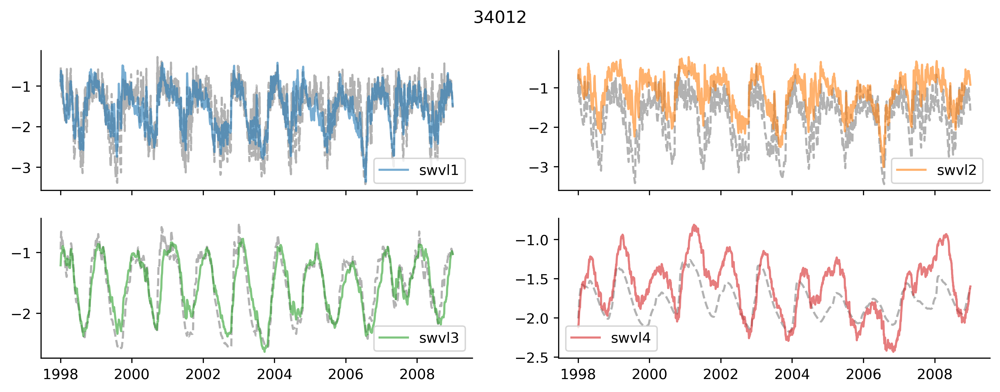

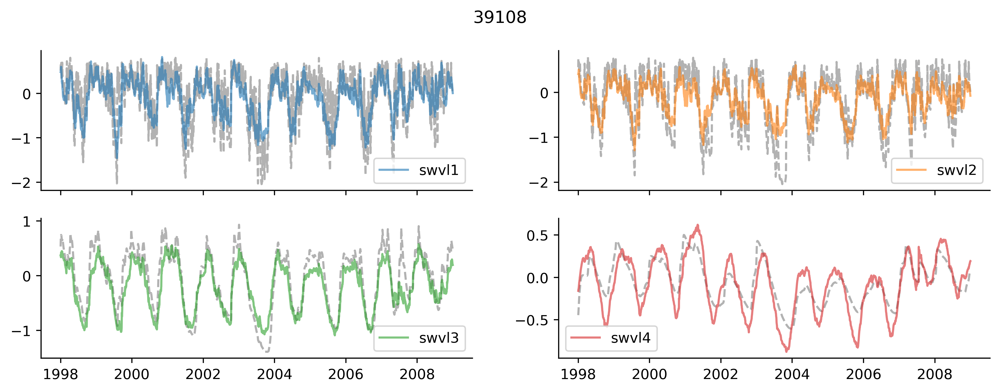

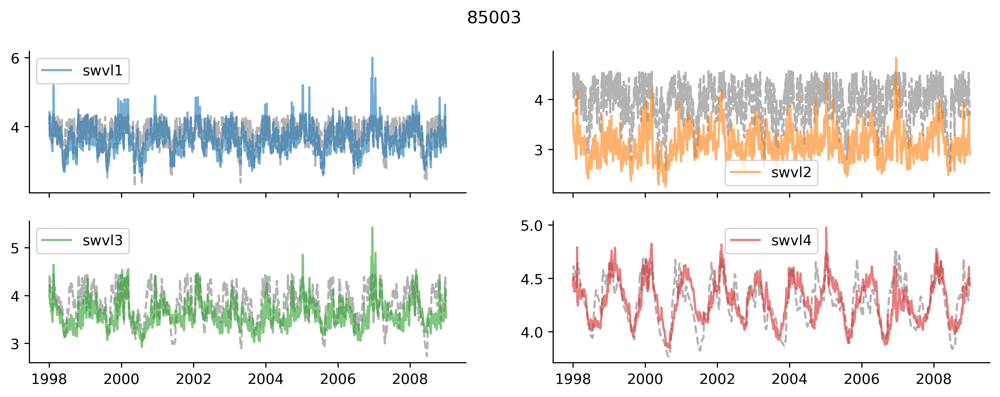

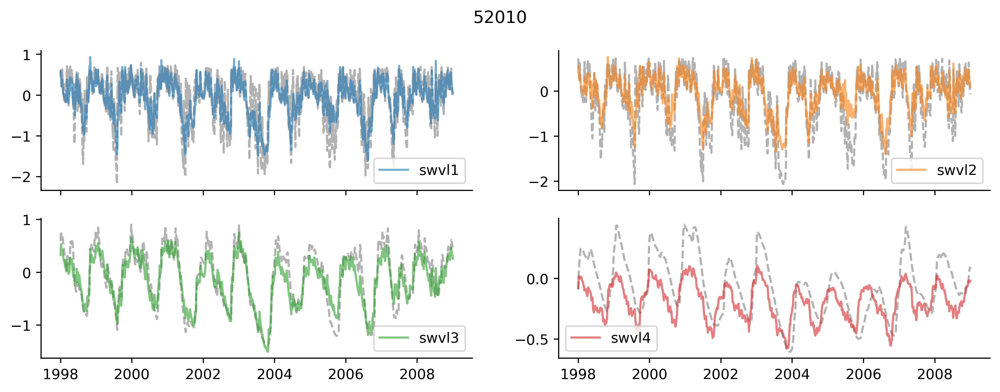

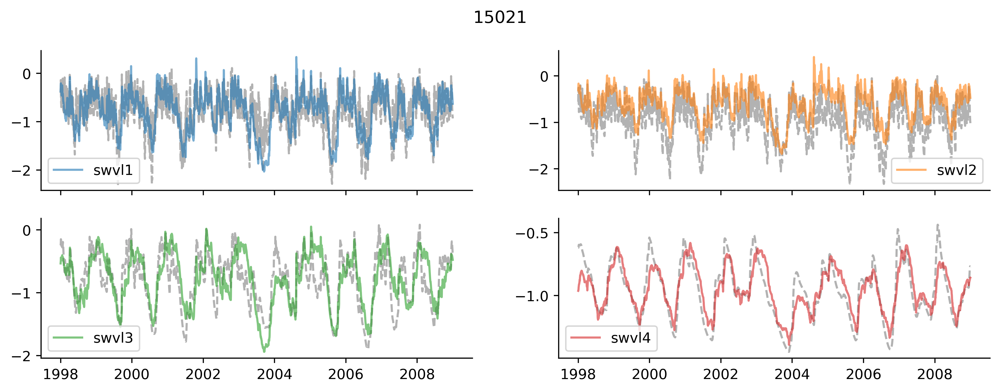

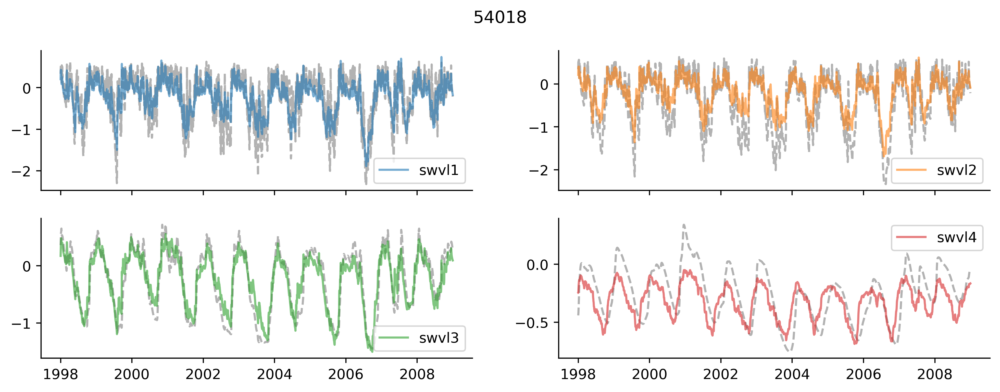

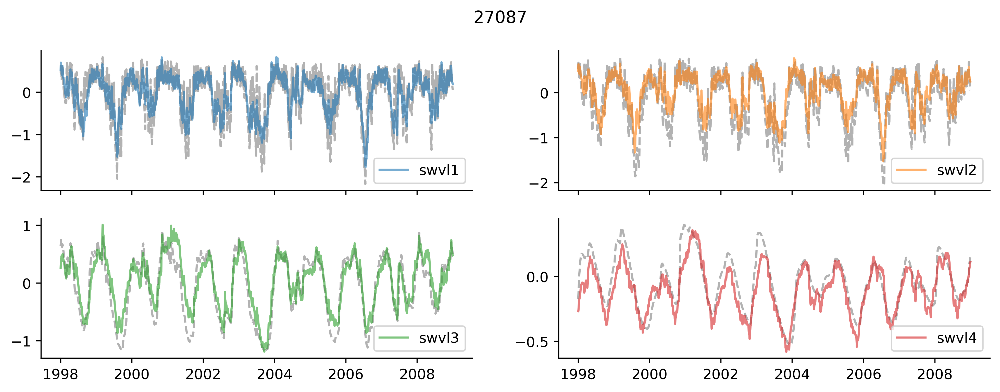

In [167]:
p = ohe_models_preds["swvl1"]["preds"]
time = slice("1998", "2008")

N = 3
pixels = np.random.choice(p.station_id.values, N, replace=False)
# pixels = [27030, 38012, 39017]
# pixels = [61001, 14001, 95001]
pixels = [34012, 39108, 85003, 52010, 15021, 54018, 27087]
target_vars = [f"swvl{ix+1}" for ix in range(4)]

with plt.rc_context({"figure.dpi": 400}):
    for px in pixels:
        f, axs = plt.subplots(2, 2, figsize=(12, 4), sharex=True)
        for ix, target_var in enumerate(target_vars):
            ax = axs[np.unravel_index(ix, (2, 2))]
            preds = ohe_models_preds[target_var]["preds"]
            data = preds.sel(station_id=px, time=time)

        #     f, ax = plt.subplots(figsize=(12, 4))
            ax.plot(data.time, data.obs, color="k", ls="--", alpha=0.3)
            ax.plot(data.time, data.sim, color=f"C{ix}", ls="-", alpha=0.6, label=f"{target_var}")
            ax.legend()
            sns.despine()
        f.suptitle(px)

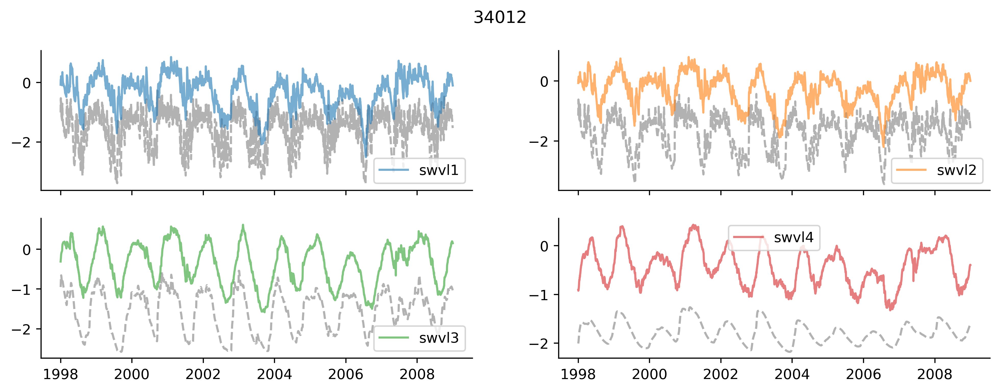

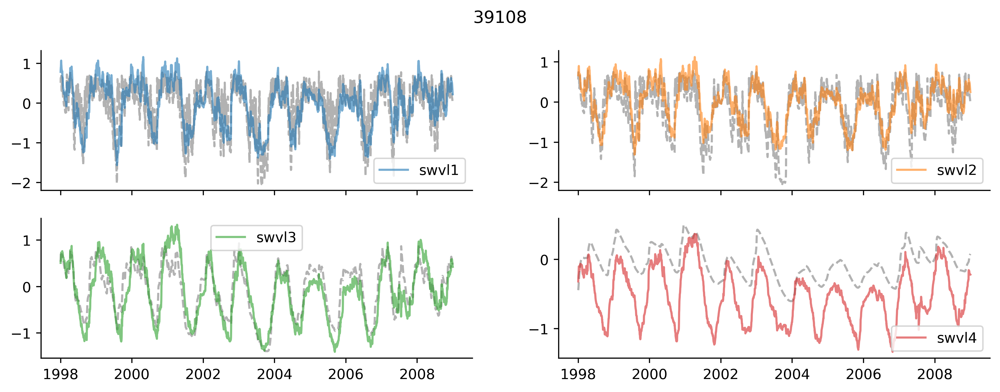

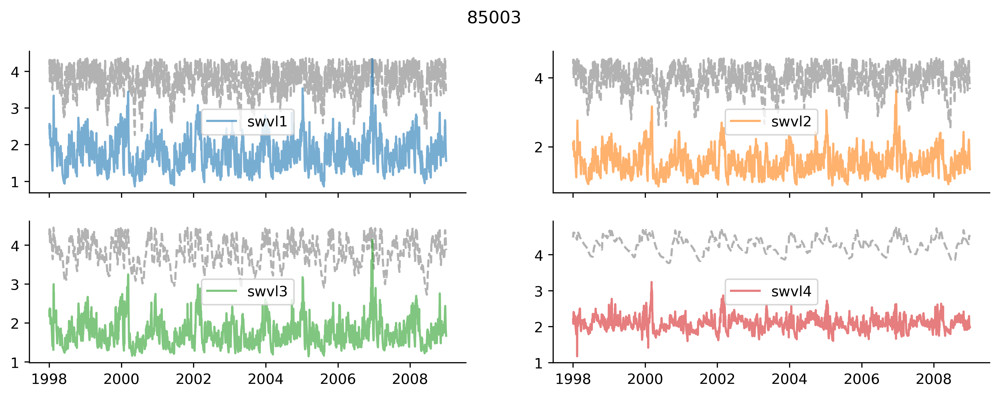

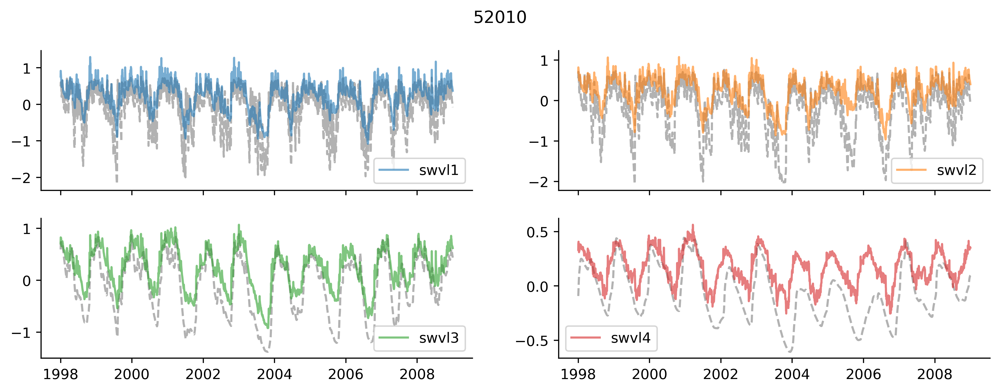

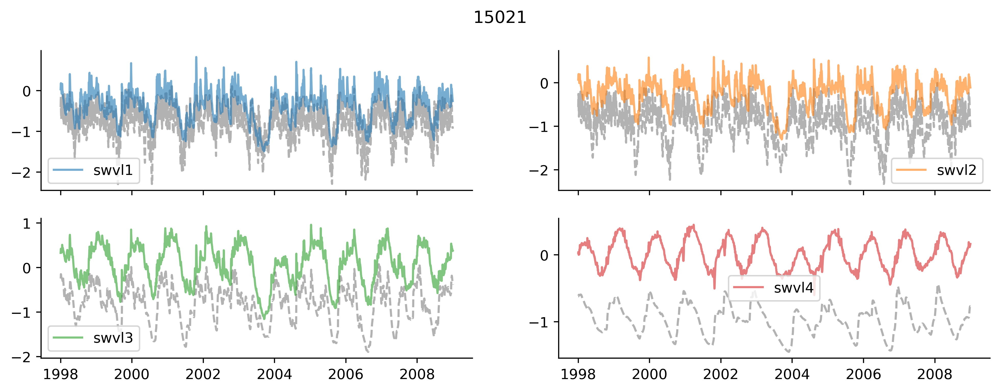

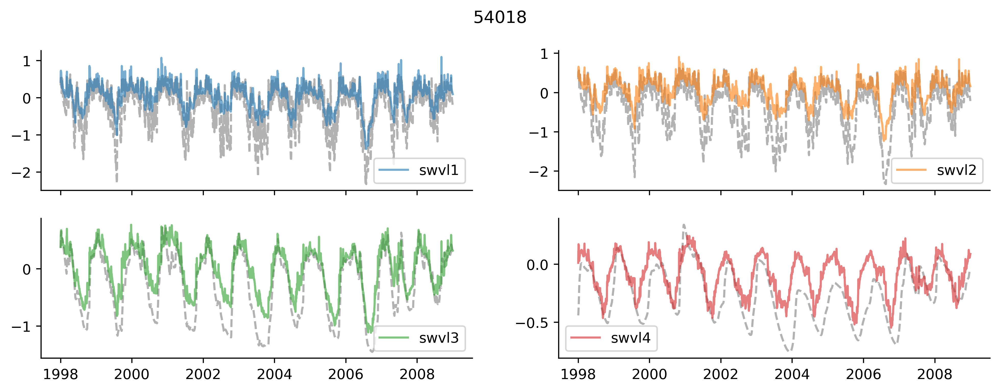

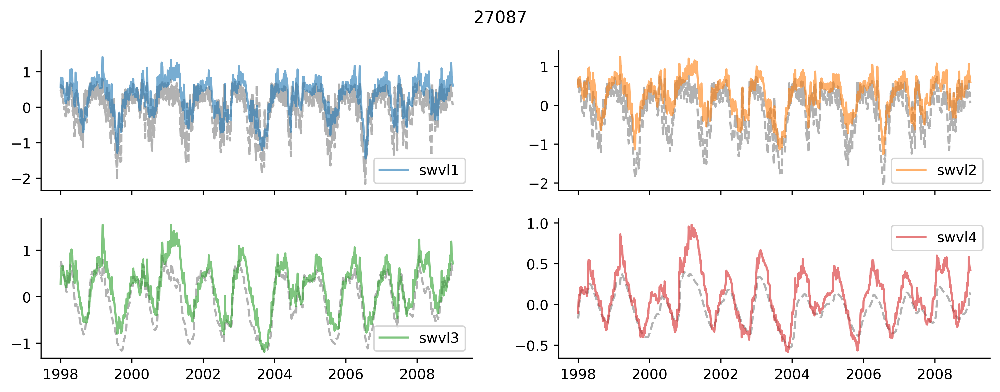

In [166]:
p = ohe_models_preds["swvl1"]["preds"]
time = slice("1998", "2008")

N = 3
pixels = np.random.choice(p.station_id.values, N, replace=False)
# pixels = [27030, 38012, 39017]
# pixels = [61001, 14001, 95001]
pixels = [34012, 39108, 85003, 52010, 15021, 54018, 27087]
target_vars = [f"swvl{ix+1}" for ix in range(4)]

with plt.rc_context({"figure.dpi": 400}):
    for px in pixels:
        f, axs = plt.subplots(2, 2, figsize=(12, 4), sharex=True)
        for ix, target_var in enumerate(target_vars):
            ax = axs[np.unravel_index(ix, (2, 2))]
            preds = all_models_preds[target_var]["preds"]
            data = preds.sel(station_id=px, time=time)

        #     f, ax = plt.subplots(figsize=(12, 4))
            ax.plot(data.time, data.obs, color="k", ls="--", alpha=0.3)
            ax.plot(data.time, data.sim, color=f"C{ix}", ls="-", alpha=0.6, label=f"{target_var}")
            ax.legend()
            sns.despine()
        f.suptitle(px)

In [156]:
# p = ohe_models_preds["swvl1"]["preds"]
# time = slice("2000", "2007")

# N = 3
# pixels = [54018, 15021]
# target_vars = [f"swvl{ix+1}" for ix in range(4)]

# with plt.rc_context({"figure.dpi": 400}):
#     for px in pixels:
#         f, axs = plt.subplots(2, 2, figsize=(12, 4), sharex=True)
#         for ix, target_var in enumerate(target_vars):
#             ax = axs[np.unravel_index(ix, (2, 2))]
#             preds = all_models_preds[target_var]["preds"]
#             data = preds.sel(station_id=px, time=time)

#         #     f, ax = plt.subplots(figsize=(12, 4))
#             ax.plot(data.time, data.obs, color="k", ls="--", alpha=0.3)
#             ax.plot(data.time, data.sim, color=f"C{ix}", ls="-", alpha=0.6, label=f"{target_var}")
#             ax.legend()
#             sns.despine()
#         f.suptitle(px)
# all_models_preds

In [152]:
static.sel(station_id=pixels)["gauge_name"]

<xarray.DataArray 'gauge_name' (station_id: 3)>
array([array('Burn at Burnham Overy', dtype=object),
       array('Brue at Lovington', dtype=object),
       array('Falloch at Glen Falloch', dtype=object)], dtype=object)
Coordinates:
  * station_id  (station_id) int64 34012 52010 85003

### Explore comparison origianl vs. OHE

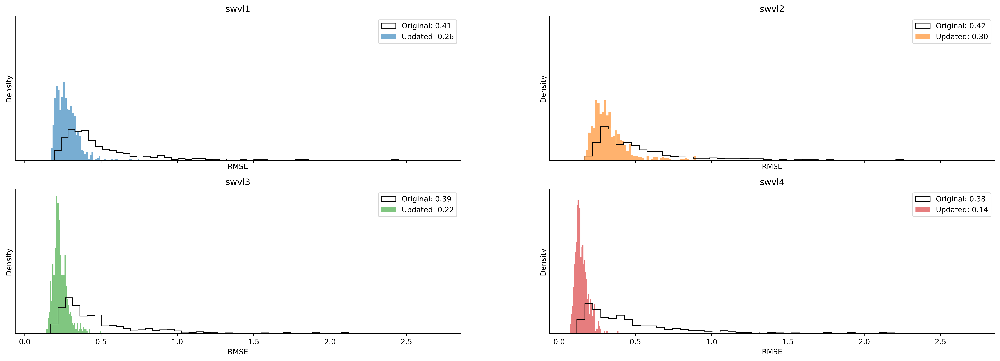

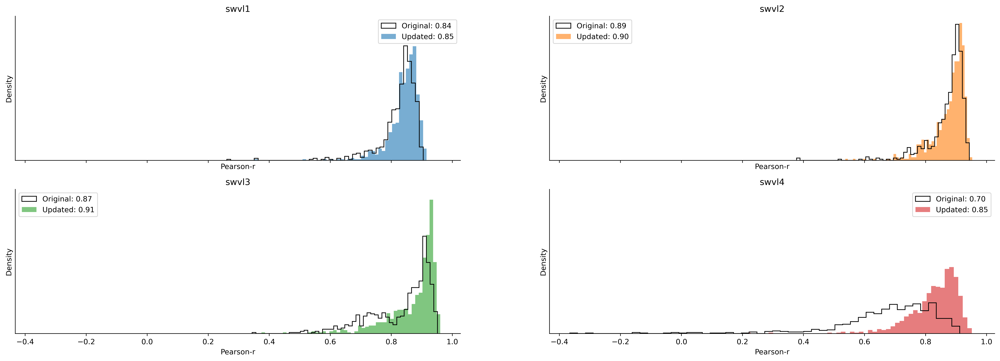

In [148]:
with plt.rc_context({"figure.dpi": 400}):
    metric = "RMSE"
    f, axs = plt.subplots(2,2 ,figsize=(12*2, 4*2), sharex=True, sharey=True)

    for ix, var in enumerate([f"swvl{ix+1}" for ix in np.arange(4)]):
        ax = axs[np.unravel_index(ix, (2, 2))]
        original = all_models_preds[var]["errors"][metric]
        med_original = np.median(original)
        updated = ohe_models_preds[var]["errors"][metric]
        med_updated = np.median(updated)

        if metric == "NSE":
            original = original.where(original > -1, -1)
            updated = updated.where(updated > -1, -1)

        ax.hist(original, bins=50, label=f"Original: {med_original:.2f}", density=True, color="k", histtype="step")
        ax.hist(updated, bins=50, alpha=0.6, label=f"Updated: {med_updated:.2f}", density=True, color=f"C{ix}")
        ax.set_title(var)
        ax.set_xlabel(metric)
        ax.set_yticks([])
        ax.set_yticklabels([])
        ax.set_ylabel("Density")

        ax.legend()
    sns.despine();
    
    
with plt.rc_context({"figure.dpi": 400}):
    metric = "Pearson-r"
    f, axs = plt.subplots(2,2 ,figsize=(12*2, 4*2), sharex=True, sharey=True)

    for ix, var in enumerate([f"swvl{ix+1}" for ix in np.arange(4)]):
        ax = axs[np.unravel_index(ix, (2, 2))]
        original = all_models_preds[var]["errors"][metric]
        med_original = np.median(original)
        updated = ohe_models_preds[var]["errors"][metric]
        med_updated = np.median(updated)

        if metric == "NSE":
            original = original.where(original > -1, -1)
            updated = updated.where(updated > -1, -1)

        ax.hist(original, bins=50, label=f"Original: {med_original:.2f}", density=True, color="k", histtype="step")
        ax.hist(updated, bins=50, alpha=0.6, label=f"Updated: {med_updated:.2f}", density=True, color=f"C{ix}")
        ax.set_title(var)
        ax.set_xlabel(metric)
        ax.set_yticks([])
        ax.set_yticklabels([])
        ax.set_ylabel("Density")

        ax.legend()
    sns.despine();

In [102]:
# if False:
if not "ohe_models_preds" in globals().keys():
    ohe_models_preds = train_and_evaluate_models(ohe_train_test)

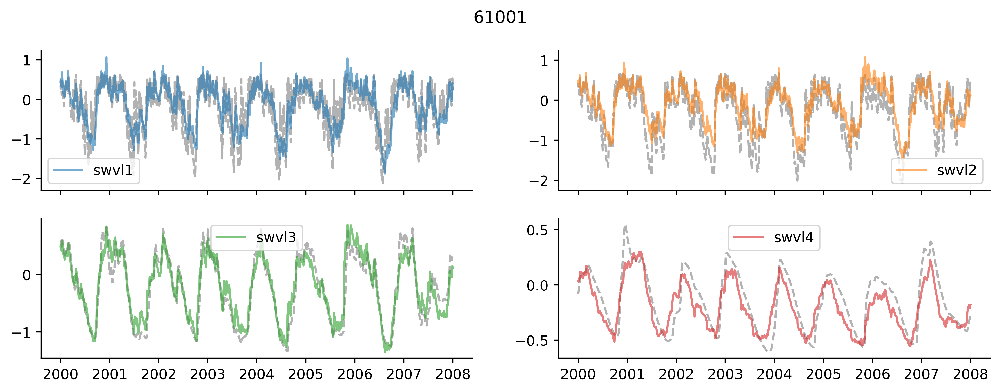

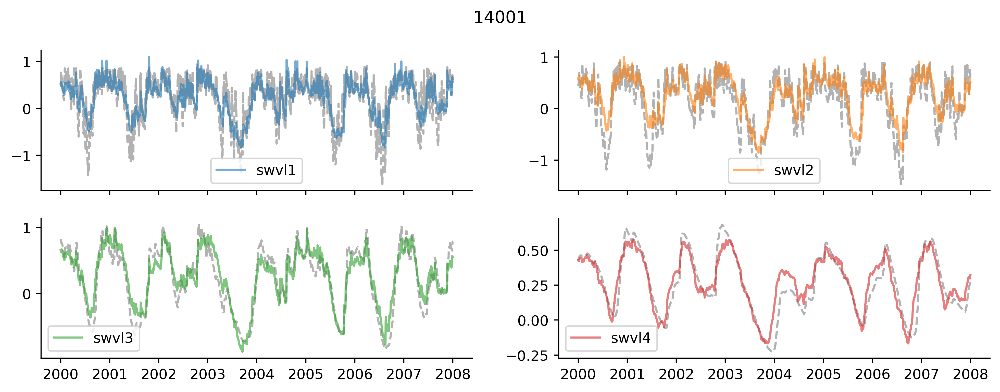

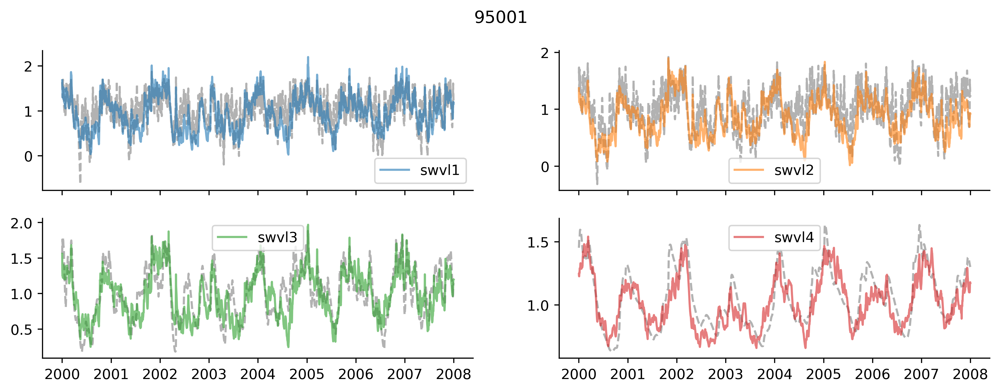

In [103]:
p = ohe_models_preds["swvl4"]["preds"]
time = slice("2000", "2007")

N = 3
pixels = np.random.choice(p.station_id.values, N, replace=False)
# pixels = [27030, 38012, 39017]
pixels = [61001, 14001, 95001]
target_vars = [f"swvl{ix+1}" for ix in range(4)]

with plt.rc_context({"figure.dpi": 400}):
    for px in pixels:
        f, axs = plt.subplots(2, 2, figsize=(12, 4), sharex=True)
        for ix, target_var in enumerate(target_vars):
            ax = axs[np.unravel_index(ix, (2, 2))]
            preds = ohe_models_preds[target_var]["preds"]
            data = preds.sel(station_id=px, time=time)

        #     f, ax = plt.subplots(figsize=(12, 4))
            ax.plot(data.time, data.obs, color="k", ls="--", alpha=0.3)
            ax.plot(data.time, data.sim, color=f"C{ix}", ls="-", alpha=0.6, label=f"{target_var}")
            ax.legend()
            sns.despine()
        f.suptitle(px)

In [ ]:
with plt.rc_context({"figure.dpi": 400}):
    metric = "NSE"
    f, axs = plt.subplots(2,2 ,figsize=(12*2, 4*2))

    for ix, var in enumerate([f"swvl{ix+1}" for ix in np.arange(4)]):
        ax = axs[np.unravel_index(ix, (2, 2))]
        original = ohe_models_preds[var]["errors"][metric]
        med_original = np.median(original)
        updated = ohe_models_preds[var]["errors"][metric]
        med_updated = np.median(updated)

        if metric == "NSE":
            original = original.where(original > -1, -1)
            updated = updated.where(updated > -1, -1)

        ax.hist(original, bins=50, label=f"Original: {med_original:.2f}", density=True, color="k", histtype="step")
        ax.hist(updated, bins=50, alpha=0.6, label=f"Updated: {med_updated:.2f}", density=True, color=f"C{ix}")
        ax.set_title(var)
        ax.set_xlabel(metric)
        ax.set_yticks([])
        ax.set_yticklabels([])
        ax.set_ylabel("Density")

        ax.legend()
    sns.despine();

In [ ]:
from collections import defaultdict

all_train_test = defaultdict(dict)

for target_var in [f"swvl{ix + 1}" for ix in np.arange(4)]:
    test_dataset = TimeSeriesDataset(
        input_data=input_test_ds,
        target_data=test_target_ds,
        target_variable=target_var,
        input_variables=[v for v in input_test_ds.data_vars],
        seq_length=seq_length,
        basin_dim=basin_dim,
        time_dim=time_dim,
        desc="Creating Test Samples",
    )
    test = get_time_basin_aligned_dictionary(test_dataset)
    
    
    train_dataset = TimeSeriesDataset(
        input_data=input_train_ds,
        target_data=train_target_ds,
        target_variable=target_var,
        input_variables=[v for v in input_train_ds.data_vars],
        seq_length=seq_length,
        basin_dim=basin_dim,
        time_dim=time_dim,
        desc="Creating Train Samples",
    )
    train = get_time_basin_aligned_dictionary(train_dataset) 
    
    all_train_test[target_var]["train"] = train
    all_train_test[target_var]["test"] = test

In [ ]:
print(dir(test_dataset))

In [ ]:
input_data = test_dataset.input_data
target_data = test_dataset.target_data

sid = input_data.isel(station_id=20).station_id.values
in_df = input_data.sel({"station_id": sid}).to_dataframe()
out_df = target_data.sel({"station_id": sid}).to_dataframe()
#  create np.ndarray
_x_d = in_df[input_variables + cfg.static_attributes].values
_y = out_df["swvl1"].values


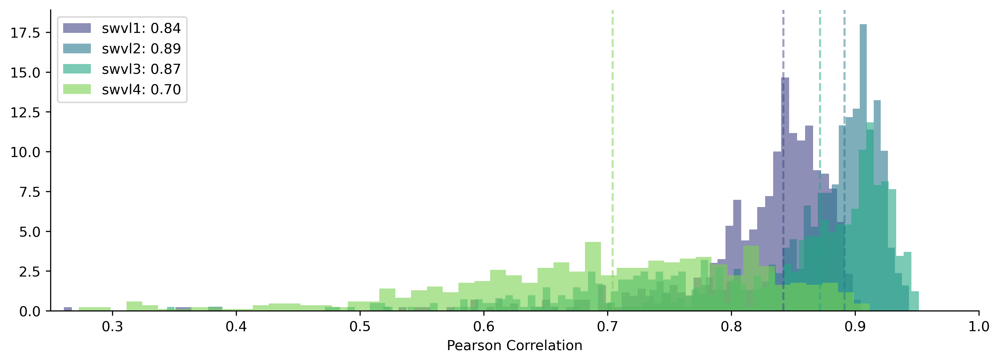

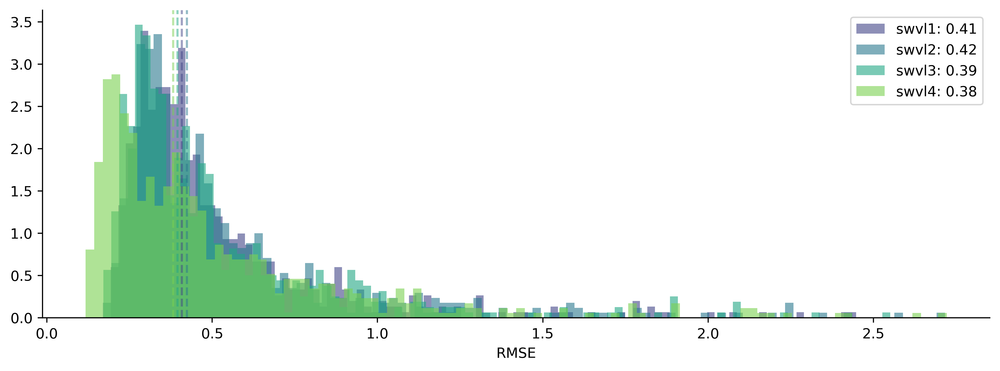

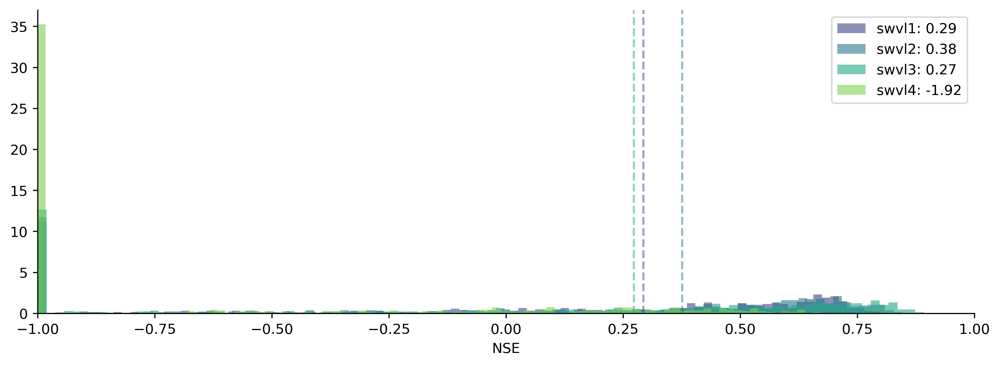

In [157]:
for metric in ["Pearson-r", "RMSE", "NSE"]:

    with plt.rc_context({'figure.dpi': 400}):
        f, ax = plt.subplots(figsize=(12, 4))

        #  metric = "Pearson-r"
        colors = sns.color_palette("viridis", n_colors=len(target_vars))
        for ix, target_var in enumerate(target_vars):
            errors = all_models_preds[target_var]["errors"]
            nse = errors[metric]

            ax.hist(nse.where(nse > -1, -1), bins=100, density=True, label=f"{target_var}: {nse.median().values:.2f}", alpha=0.6, color=colors[ix]);
            ax.axvline(nse.median(), color=colors[ix], ls="--", alpha=0.5)
        ax.set_xlabel(metric if metric != "Pearson-r" else "Pearson Correlation")
        ax.set_xlim(0.25, 1) if metric in ["Pearson-r"] else None
        ax.set_xlim(-1, 1) if metric in ["NSE"] else None
        ax.legend()
        sns.despine()